<a href="https://colab.research.google.com/github/sultanardian/Kuliah/blob/main/data%20visualitation/Data_Visualitation_A_UAS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## CHAPTER 1


In [ ]:
import pandas as pd
import seaborn as sns
from numpy import median, mean

In [ ]:
olympics_df = pd.read_csv('https://raw.githubusercontent.com/TrainingByPackt/Interactive-Data-Visualization-with-Python/master/datasets/athlete_events.csv')
olympics_df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [ ]:
# filter the DataFrame to contain medal winners only (for non-winners, the Medal feature is NaN)
# note use of the inplace parameter
olympics_winners = olympics_df.dropna(subset=['Medal'])
olympics_winners.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
37,15,Arvo Ossian Aaltonen,M,30.0,NaN,NaN,Finland,FIN,1920 Summer,1920,Summer,Antwerpen,Swimming,Swimming Men's 200 metres Breaststroke,Bronze
38,15,Arvo Ossian Aaltonen,M,30.0,NaN,NaN,Finland,FIN,1920 Summer,1920,Summer,Antwerpen,Swimming,Swimming Men's 400 metres Breaststroke,Bronze
40,16,Juhamatti Tapio Aaltonen,M,28.0,184.0,85.0,Finland,FIN,2014 Winter,2014,Winter,Sochi,Ice Hockey,Ice Hockey Men's Ice Hockey,Bronze
41,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,Finland,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Individual All-Around,Bronze


In [ ]:
# print records for each value of the feature 'Sport'
olympics_winners_2016 = olympics_winners[(olympics_winners.Year == 2016)]
olympics_winners_2016.Sport.value_counts()

Athletics                192
Swimming                 191
Rowing                   144
Football                 106
Hockey                    99
Handball                  89
Cycling                   84
Canoeing                  82
Water Polo                78
Rugby Sevens              74
Basketball                72
Wrestling                 72
Volleyball                72
Gymnastics                66
Fencing                   65
Judo                      56
Boxing                    51
Shooting                  45
Equestrianism             45
Weightlifting             45
Sailing                   45
Diving                    36
Taekwondo                 32
Synchronized Swimming     32
Table Tennis              24
Tennis                    24
Archery                   24
Badminton                 24
Rhythmic Gymnastics       18
Beach Volleyball          12
Golf                       6
Trampolining               6
Modern Pentathlon          6
Triathlon                  6
Name: Sport, d

In [ ]:
# list the top 5 sports
top_sports = ['Athletics', 'Swimming', 'Rowing', 'Football', 'Hockey']
# subset the DataFrame to include data from the top sports
olympics_top_sports_winners_2016 = olympics_winners_2016[(olympics_winners_2016.Sport.isin(top_sports))]
olympics_top_sports_winners_2016.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
158,62,Giovanni Abagnale,M,21.0,198.0,90.0,Italy,ITA,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Men's Coxless Pairs,Bronze
814,465,"Matthew ""Matt"" Abood",M,30.0,197.0,92.0,Australia,AUS,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Men's 4 x 100 metres Freestyle Relay,Bronze
1228,690,Chantal Achterberg,F,31.0,172.0,72.0,Netherlands,NED,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Women's Quadruple Sculls,Silver
1529,846,Valerie Kasanita Adams-Vili (-Price),F,31.0,193.0,120.0,New Zealand,NZL,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,Athletics Women's Shot Put,Silver
1847,1017,Nathan Ghar-Jun Adrian,M,27.0,198.0,100.0,United States,USA,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Men's 50 metres Freestyle,Bronze


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



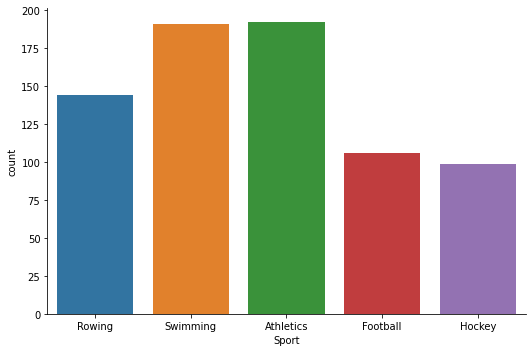

In [ ]:
# generate bar plot indicating count of medals awarded in each of the top sports
g = sns.catplot('Sport', data=olympics_top_sports_winners_2016,
kind="count", aspect=1.5)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



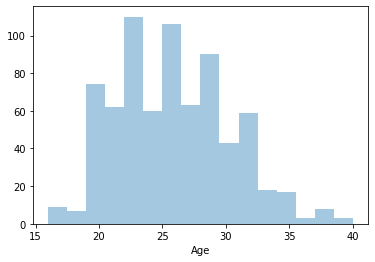

In [ ]:
sns.distplot(olympics_top_sports_winners_2016.Age, kde=False)

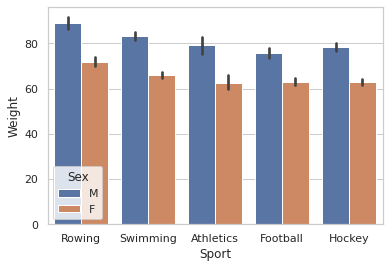

In [ ]:
sns.set(style="whitegrid")
sns.barplot(x="Sport", y="Weight", data=olympics_top_sports_winners_2016, estimator=mean, hue='Sex')

## CHAPTER 2

In [ ]:
# filter the DataFrame to contain medal winners only (for non-winners, the Medal feature is NaN)
# note use of the inplace parameter
olympics_winners = olympics_df.dropna(subset=['Medal'])
# list the top 5 sports
top_sports = ['Athletics', 'Swimming', 'Rowing', 'Football',
'Hockey']
# filter dataframe to include 2016 records of specified sports
olympics_top_sports_winners_2016 = olympics_winners[(olympics_winners.Sport.isin(top_sports)) & (olympics_winners.Year == 2016)]
olympics_top_sports_winners_2016.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
158,62,Giovanni Abagnale,M,21.0,198.0,90.0,Italy,ITA,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Men's Coxless Pairs,Bronze
814,465,"Matthew ""Matt"" Abood",M,30.0,197.0,92.0,Australia,AUS,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Men's 4 x 100 metres Freestyle Relay,Bronze
1228,690,Chantal Achterberg,F,31.0,172.0,72.0,Netherlands,NED,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Women's Quadruple Sculls,Silver
1529,846,Valerie Kasanita Adams-Vili (-Price),F,31.0,193.0,120.0,New Zealand,NZL,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,Athletics Women's Shot Put,Silver
1847,1017,Nathan Ghar-Jun Adrian,M,27.0,198.0,100.0,United States,USA,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Men's 50 metres Freestyle,Bronze


In [ ]:
olympics_top_sports_winners_2016[['Age', 'Height', 'Weight']].describe()

,Age,Height,Weight
count,732.000000,729.000000,727.000000
mean,25.577869,180.023320,73.720770
std,4.451373,10.076398,14.279014
min,16.000000,150.000000,40.000000
25%,22.000000,173.000000,64.000000
50%,25.000000,180.000000,72.000000
75%,29.000000,187.000000,82.000000
max,40.000000,207.000000,136.000000


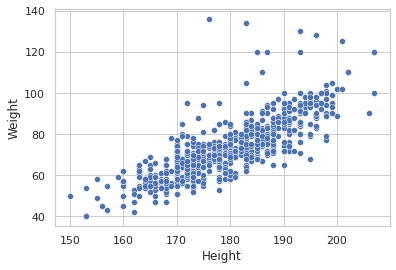

In [ ]:
# import the seaborn library
import matplotlib.pyplot as plt
import seaborn as sns
fig1 = plt.figure()
ax = fig1.add_subplot(111)
ax = sns.scatterplot(x="Height", y="Weight", data=olympics_top_sports_winners_2016)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



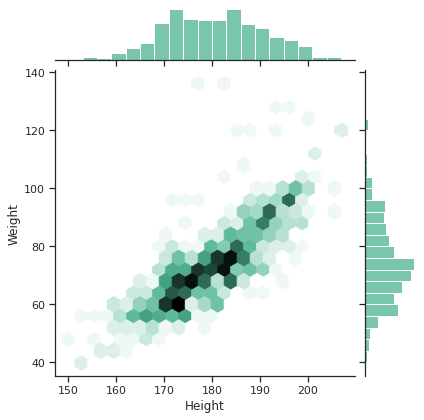

In [ ]:
sns.set(style="ticks")
## hexbin plot
sns.jointplot(olympics_top_sports_winners_2016.Height, olympics_top_sports_winners_2016.Weight, kind="hex", color="#4CB391")

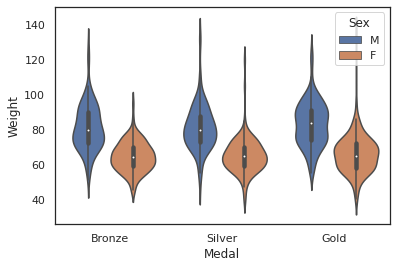

In [ ]:
sns.set_style('white')
ax1 = sns.violinplot(x='Medal', y='Weight', data=olympics_top_sports_winners_2016, hue='Sex')

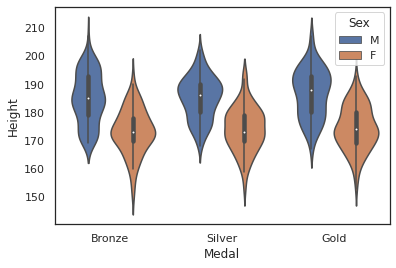

In [ ]:
ax2 = sns.violinplot(x='Medal', y='Height', data=olympics_top_sports_winners_2016, hue='Sex')

## CHAPTER 3

In [ ]:
import plotly.express as px

In [ ]:
url_co2 = 'https://raw.githubusercontent.com/TrainingByPackt/Interactive-Data-Visualization-with-Python/master/datasets/co2.csv'
url_gm = 'https://raw.githubusercontent.com/TrainingByPackt/Interactive-Data-Visualization-with-Python/master/datasets/gapminder.csv'
co2 = pd.read_csv(url_co2)
gm = pd.read_csv(url_gm)
df_gm = gm[['Country', 'region']].drop_duplicates()
df_w_regions = pd.merge(co2, df_gm, left_on='country', right_on='Country', how='inner')
df_w_regions = df_w_regions.drop('Country', axis='columns')
new_co2 = pd.melt(df_w_regions, id_vars=['country', 'region'])
columns = ['country', 'region', 'year', 'co2']
new_co2.columns = columns
df_co2 = new_co2[new_co2['year'].astype('int64') > 1963]
df_co2 = df_co2.sort_values(by=['country', 'year'])
df_co2['year'] = df_co2['year'].astype('int64')
df_gdp = gm[['Country', 'Year', 'gdp']]
df_gdp.columns = ['country', 'year', 'gdp']
data = pd.merge(df_co2, df_gdp, on=['country', 'year'], how='left')
data = data.dropna()

In [ ]:
scat = px.scatter(data, x = 'year', y = 'co2', color = 'region', marginal_y = 'box')
scat.show()

In [ ]:
scat1 = px.scatter(data, x = 'gdp', y = 'co2', color = 'region',marginal_y = 'box', marginal_x = 'rug', animation_frame = 'year', animation_group = 'country')
scat1.show()

In [ ]:
dens1 = px.density_contour(data, x="gdp", y="co2", color="region", marginal_x="rug", marginal_y="histogram", animation_frame = 'year', animation_group = 'region')
dens1.show()

## CHAPTER 4

In [ ]:
gps_apps_df =pd.read_csv('https://raw.githubusercontent.com/TrainingByPackt/Interactive-Data-Visualization-with-Python/master/datasets/googleplaystore.csv')
#worldrank_df = pd.read_csv('https://raw.githubusercontent.com/TrainingByPackt/Interactive-Data-Visualization-with-Python/master/datasets/googleplaystore.csv')
# preview DataFrame
gps_apps_df.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


In [ ]:
gps_apps_df = gps_apps_df.dropna()

In [ ]:
#import altair
import altair as alt
alt.data_transformers.enable('default',max_rows=None)
# create bar plot
alt.Chart(gps_apps_df).mark_bar().encode(x='Content Rating:N',y='count():Q').properties(width=200)

alt.Chart(...)

In [ ]:
# create heatmap
alt.Chart(gps_apps_df).mark_rect().encode(
alt.X('Category:N'),
alt.Y('Rating:Q',bin=True),
alt.Color('count()',
scale=alt.Scale(scheme='greenblue'),
legend=alt.Legend(title='Total Apps')
)).properties(width=600)

alt.Chart(...)

In [ ]:
# define selection
selected_category = alt.selection(type="single", encodings=['x'])
# heatmap
heatmap = alt.Chart(gps_apps_df).mark_rect().encode(
alt.X('Category:N'),
alt.Y('Rating:Q', bin=True),
alt.Color('count()',
scale=alt.Scale(scheme='greenblue'),
legend=alt.Legend(title='Total Apps')
)).properties(width=600)
# circles to be placed on the heatmap
circles = heatmap.mark_point().encode(
alt.ColorValue('grey'),
alt.Size('count()',
scale=alt.Scale(domain=(1,600),range=(1,200)),
legend=alt.Legend(title='Apps in Selection')
)
).transform_filter(selected_category)

In [ ]:
# bar plot
bars = alt.Chart(gps_apps_df).mark_bar().encode(
x='Content Rating:N',
y='count()',
color=alt.condition(selected_category, alt.ColorValue("steelblue"),
alt.ColorValue("grey"))).properties(width=200).add_selection(selected_category)
# layering and hconcat heatmap+circles|bars
bars

alt.Chart(...)

## CHAPTER 5

In [ ]:
from bokeh.io import show
from bokeh.layouts import column
from bokeh.models import ColumnDataSource, RangeTool
from bokeh.plotting import figure
from bokeh.io import push_notebook, show, output_notebook
from pathlib import Path
import pandas as pd
import numpy as np
from ipywidgets import interact
%matplotlib inline

In [ ]:
from bokeh.io import show
from bokeh.layouts import column
from bokeh.models import ColumnDataSource, RangeTool
from bokeh.plotting import figure
from bokeh.io import push_notebook, show, output_notebook
from pathlib import Path
import pandas as pd
import numpy as np
from ipywidgets import interact
%matplotlib inline

In [ ]:
microsoft_df = pd.read_csv('https://raw.githubusercontent.com/TrainingByPackt/Interactive-Data-Visualization-with-Python/master/datasets/chap5_data/microsoft_stock.csv', parse_dates=['date'])

In [ ]:
microsoft_df.index = microsoft_df.date

In [ ]:
dates = np.array(microsoft_df['date'], dtype=np.datetime64)
source = ColumnDataSource(data=dict(date=dates, close=microsoft_df['high']))

In [ ]:
p = figure(plot_height=300, plot_width=800, tools='xpan', toolbar_location=None, title='Time Series Stock Data',
 x_axis_type='datetime', x_axis_location='above',
 background_fill_color='#ffefef', x_range=(dates[1000],
dates[1800]))
r = p.line('date', 'close', source=source)
p.yaxis.axis_label = 'High Price'

In [ ]:
select = figure(title='Drag To See More Data',plot_width=800, y_range=p.y_range,
 x_axis_type='datetime', y_axis_type=None, plot_height=130, tools='', background_fill_color='#ffefef', toolbar_location=None,)
range_tool = RangeTool(x_range=p.x_range)
range_tool.overlay.fill_color = 'green'
range_tool.overlay.fill_alpha = 0.2

In [ ]:
def update(f):
    if f == 'day':
        r.data_source.data = dict({
            'date': microsoft_df.index,
            'high': microsoft_df.high
        })
    elif f == 'month':
        month = microsoft_df.groupby(pd.Grouper(freq='M'))[['high']].mean()
        r.data_source.data = dict({
        'date': month.index,
        'high': month.high
        })
    elif f == 'year':
        year = microsoft_df.groupby(pd.Grouper(freq='Y'))[['high']].mean()
        r.data_source.data = dict({
        'date': year.index,
        'high': year.high
        })
        push_notebook()
        
select.line('date', 'high', source=source)
select.ygrid.grid_line_color = None
select.add_tools(range_tool)
select.toolbar.active_multi = range_tool
show(column(p, select), notebook_handle=True)

ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "y" value "high" [renderer: GlyphRenderer(id='1614', ...)]


In [ ]:
select.line('date', 'high', source=source)
select.ygrid.grid_line_color = None
select.add_tools(range_tool)
select.toolbar.active_multi = range_tool
show(column(p, select), notebook_handle=True)
interact(update, f=['day', 'month', 'year'])

RuntimeError: ignored

## CHAPTER 6

In [ ]:
import pandas as pd
renewable_energy_prod_url = "https://raw.githubusercontent.com/TrainingByPackt/Interactive-Data-Visualization-with-Python/master/datasets/share-of-electricity-production-from-renewable-sources.csv"
renewable_energy_prod_df = pd.read_csv(renewable_energy_prod_url)
renewable_energy_prod_df.head()

,Country,Code,Year,Renewable electricity (% electricity production)
0,Afghanistan,AFG,1990,67.730496
1,Afghanistan,AFG,1991,67.980296
2,Afghanistan,AFG,1992,67.994310
3,Afghanistan,AFG,1993,68.345324
4,Afghanistan,AFG,1994,68.704512


In [ ]:
renewable_energy_prod_df.sort_values(by=['Year'],inplace=True)
renewable_energy_prod_df.head()

,Country,Code,Year,Renewable electricity (% electricity production)
0,Afghanistan,AFG,1990,67.730496
1668,France,FRA,1990,13.369879
1643,Finland,FIN,1990,29.451790
1618,Fiji,FJI,1990,82.441113
1593,Faeroe Islands,FRO,1990,35.545024


In [ ]:
import plotly.express as px
renewable_energy_prod = renewable_energy_prod_df.query('Year<2017 and Year>2007')
fig = px.choropleth(renewable_energy_prod_df, locations="Code", color="Renewable electricity (% electricity production)", hover_name="Country", animation_frame="Year", color_continuous_scale='Greens')

In [ ]:
fig.update_layout(
# add a title text for the plot
title_text = 'Renewable energy production across the world (% of electricity production)',
# set projection style for the plot
geo = dict(projection={'type':'natural earth'})) # by default, projection type is set to 'equirectangular')
fig.show()

In [ ]:
import pandas as pd
renewable_energy_cons_url = "https://raw.githubusercontent.com/TrainingByPackt/Interactive-Data-Visualization-with-Python/master/datasets/renewable-energy-consumption-by-country.csv"
renewable_energy_cons_df = pd.read_csv(renewable_energy_cons_url)
renewable_energy_cons_df.head()

,Country,Code,Year,Traditional biofuels,"Other renewables (modern biofuels, geothermal, wave & tidal)",Wind,Solar PV,Hydropower,Total
0,Algeria,DZA,1965,NaN,0.0,0.0,0.0,NaN,0.0
1,Algeria,DZA,1966,NaN,0.0,0.0,0.0,NaN,0.0
2,Algeria,DZA,1967,NaN,0.0,0.0,0.0,NaN,0.0
3,Algeria,DZA,1968,NaN,0.0,0.0,0.0,NaN,0.0
4,Algeria,DZA,1969,NaN,0.0,0.0,0.0,NaN,0.0


In [ ]:
#renewable_energy_long_df = pd.wide_to_long(renewable_energy_df, stubnames='Consumption', i=['Country', 'Code','Year'], j='Energy_Source')
#renewable_energy_long_df.head()
renewable_energy_cons_df = pd.melt(renewable_energy_cons_df, \
id_vars=['Country', 'Code','Year'], \
var_name="Energy Source", \
value_name="Consumption (terrawatt-hours)")
renewable_energy_cons_df.head()

,Country,Code,Year,Energy Source,Consumption (terrawatt-hours)
0,Algeria,DZA,1965,Traditional biofuels,NaN
1,Algeria,DZA,1966,Traditional biofuels,NaN
2,Algeria,DZA,1967,Traditional biofuels,NaN
3,Algeria,DZA,1968,Traditional biofuels,NaN
4,Algeria,DZA,1969,Traditional biofuels,NaN


In [ ]:
import plotly.express as px
renewable_energy_total_cons = renewable_energy_cons_df[renewable_energy_cons_df['Energy Source']=='Total'].query('Year<2017 and Year>2007')
fig = px.choropleth(renewable_energy_total_cons, locations="Code", color="Consumption (terrawatt-hours)", hover_name="Country", animation_frame="Year",color_continuous_scale='Blues')

In [ ]:
fig.update_layout(
# add a title text for the plot
title_text = 'Renewable energy consumption across the world (terrawatt-hours)',
# set projection style for the plot
geo = dict(projection={'type':'natural earth'})) # by default,projection type is set to 'equirectangular')
fig.show()

## CHAPTER 7

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px

In [ ]:
co2 = pd.read_csv('https://raw.githubusercontent.com/TrainingByPackt/Interactive-Data-Visualization-with-Python/master/datasets/co2.csv')
gm = pd.read_csv('https://raw.githubusercontent.com/TrainingByPackt/Interactive-Data-Visualization-with-Python/master/datasets/gapminder.csv')
df_gm = gm[['Country', 'region']].drop_duplicates()
df_w_regions = pd.merge(co2, df_gm, left_on='country', right_on='Country', how='inner')
df_w_regions = df_w_regions.drop('Country', axis='columns')
new_co2 = pd.melt(df_w_regions, id_vars=['country', 'region'])
columns = ['country', 'region', 'year', 'co2']
new_co2.columns = columns
df_co2 = new_co2[new_co2['year'].astype('int64') > 1963]
df_co2 = df_co2.sort_values(by=['country', 'year'])
df_co2['year'] = df_co2['year'].astype('int64')
df_g = gm[['Country', 'Year', 'gdp', 'population', 'fertility', 'life']]
df_g.columns = ['country', 'year', 'gdp', 'population', 'fertility', 'life']
data = pd.merge(df_co2, df_g, on=['country', 'year'], how='left')
data = data.dropna()

In [ ]:
data.head()

,country,region,year,co2,gdp,population,fertility,life
0,Afghanistan,South Asia,1964,0.0863,1182.0,10474903.0,7.671,33.639
1,Afghanistan,South Asia,1965,0.1010,1182.0,10697983.0,7.671,34.152
2,Afghanistan,South Asia,1966,0.1080,1168.0,10927724.0,7.671,34.662
3,Afghanistan,South Asia,1967,0.1240,1173.0,11163656.0,7.671,35.170
4,Afghanistan,South Asia,1968,0.1160,1187.0,11411022.0,7.671,35.674


In [ ]:
fig = px.scatter(data, x="life", y="co2", size="population", color="region", animation_frame = 'year', animation_group = 'country', hover_name="country", size_max=60)
fig.show()

In [ ]:
np1 = np.array(data['co2'])
np2 = np.array(data['life'])

In [ ]:
np.corrcoef(np1, np2)

array([[1.        , 0.40288934],
       [0.40288934, 1.        ]])

In [ ]:
np1 = np.array(data['co2'])
np2 = np.array(data['gdp'])
np.corrcoef(np1, np2)

array([[1.        , 0.78219731],
       [0.78219731, 1.        ]])

In [ ]:
fig = px.scatter(data, x="fertility", y="co2", size="population", color="region", animation_frame = 'year', animation_group = 'country', hover_name="country", size_max=60)
fig.show()

In [ ]:
np1 = np.array(data['co2'])
np2 = np.array(data['fertility'])
np.corrcoef(np1, np2)

array([[ 1.        , -0.31439742],
       [-0.31439742,  1.        ]])